In [1]:
import os
from tqdm.autonotebook import tqdm, trange

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  


In [2]:
import torch
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnext50_32x4d', pretrained=True)

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth


  0%|          | 0.00/95.8M [00:00<?, ?B/s]

In [ ]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
ls data

ls: cannot access 'data': No such file or directory


In [4]:

data_transforms = {
    'train': transforms.Compose([
        # transforms.RandomResizedCrop(244),
        # transforms.RandomHorizontalFlip(),
        #transforms.RandomRotation(degrees=(0, 5)),
        transforms.Resize(256),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        # transforms.CenterCrop(244),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),

        'test': transforms.Compose([
        transforms.Resize(256),
        # transforms.CenterCrop(244),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = 'gdrive/My Drive/data_prep'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val', 'test']}

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,
                                              shuffle=True, num_workers=2)
               for x in ['train', 'val', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}
class_names = image_datasets['train'].classes

use_gpu = torch.cuda.is_available()

In [ ]:
print(dataset_sizes)

{'train': 12281, 'val': 1907, 'test': 4752}


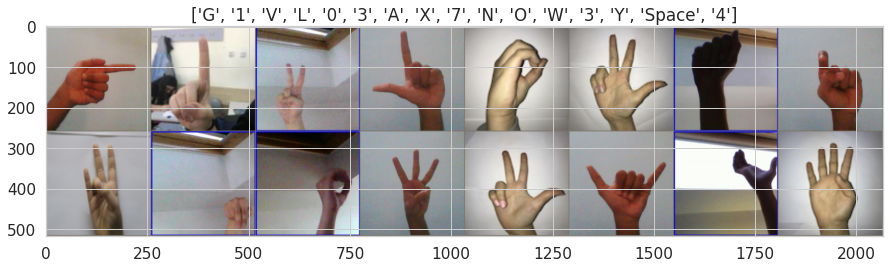

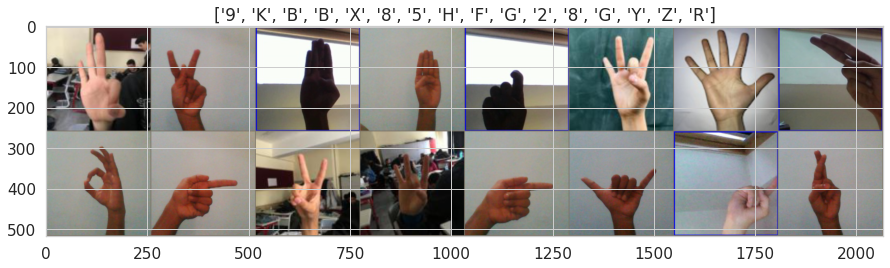

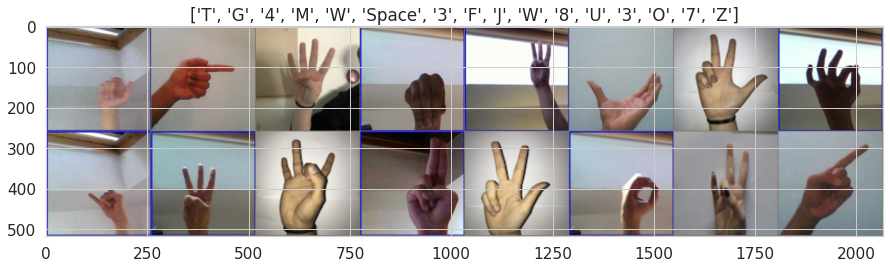

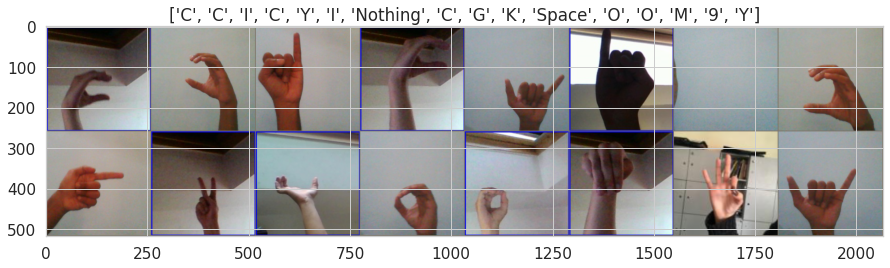

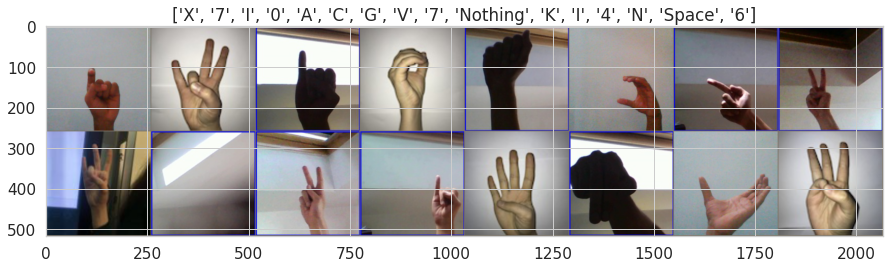

In [18]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)


for _ in range(5):
  inputs, classes = next(iter(dataloaders['train']))

  out = torchvision.utils.make_grid(inputs)

  imshow(out, title=[class_names[x] for x in classes])

In [5]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = model.state_dict()
    best_acc = 0.0
    
    losses = {'train': [], "val": []}
    accs = {'train': [], "val": []}

    pbar = trange(num_epochs, desc="Epoch:")

    for epoch in pbar:

        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train(True)  # установим модель в режим обучения
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # итерируемся по батчам
            for data in tqdm(dataloaders[phase], leave=False, desc=f"{phase} iter:"):
                # получаем картинки и метки
                inputs, labels = data

                if use_gpu:
                    inputs = inputs.cuda()
                    labels = labels.cuda()
                else:
                    inputs, labels = inputs, labels

                # инициализируем градиенты параметров
                if phase=="train":
                    optimizer.zero_grad()

                # forward pass
                if phase == "eval":
                    with torch.no_grad():
                        outputs = model(inputs)
                else:
                    outputs = model(inputs)
                preds = torch.argmax(outputs, -1)
                loss = criterion(outputs, labels)

                # backward pass, оптимизируем только если это стадия обучения
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

                # считаем лоссы
                running_loss += loss.item()
                running_corrects += int(torch.sum(preds == labels.data))

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects / dataset_sizes[phase]
            
            losses[phase].append(epoch_loss)
            accs[phase].append(epoch_acc)
            
            pbar.set_description('{} Loss: {:.4f} Acc: {:.4f}'.format(
                                    phase, epoch_loss, epoch_acc
                                ))

            # если достиглось лучшее качество, то запомним веса модели
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # загрузим лучшие веса модели
    model.load_state_dict(best_model_wts)
    return model, losses, accs

In [6]:
def visualize_model(model, num_batches=6):
  for _ in range(num_batches):
    inputs, classes = next(iter(dataloaders['test']))
    out = torchvision.utils.make_grid(inputs)
    inputs = inputs.cuda()
    outputs = model(inputs)
    _, preds = torch.max(outputs.data, 1)

    label_dict = {
        0:'0',
        1:'1',
        2:'2',
        3:'3',
        4:'4',
        5:'5',
        6:'6',
        7:'7',
        8:'8',
        9:'9',
        10:'A',
        11:'B',
        12:'C',
        13:'D',
        14:'E',
        15:'F',
        16:'J',
        17:'H',
        18:'I',
        19:'J',
        20:'K',
        21:'L',
        22:'M',
        23:'N',
        24:'Nothing',
        25:'O',
        26:'P',
        27:'Q',
        28:'R',
        29:'S',
        30:'Space',
        31:'T',
        32:'U',
        33:'V',
        34:'W',
        35:'X',
        36:'Y',
        37:'Z'
  
    }


    # if str(preds.cpu().numpy())!=str([class_names[x] for x in classes]).replace(',','').replace("'",''):
    title='         real:' + str([class_names[x] for x in classes]) + '\npredicted:' + str([label_dict[int(x)] for x in (preds.cpu().numpy())])

    imshow(out, title=title)

In [7]:
def evaluate(model):
    model.eval()
    
    runninig_correct = 0
    for data in dataloaders['val']:
        # получаем картинки и метки
        inputs, labels = data
        
        # переносим на gpu, если возможно
        if use_gpu:
            inputs = inputs.cuda()
            labels = labels.cuda()
            
        # forard pass
        output = model(inputs)
        _, predicted = torch.max(output, 1)
        
        runninig_correct += int(torch.sum(predicted == labels))
        
    return runninig_correct / dataset_sizes['val']

* **Fine Tuning** способ, обучаем всю сеть

In [ ]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnext50_32x4d', pretrained=True)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


In [ ]:
# num_features - размерность вектора фич, поступающего на вход FC-слою
num_features = 2048
# Заменяем Fully-Connected слой на линейный классификатор
model.fc = nn.Linear(num_features, 38)

# Использовать ли GPU
if use_gpu:
    model = model.cuda()

loss_fn = nn.CrossEntropyLoss()

optimizer_ft = optim.Adam(model.parameters(), lr=1e-4)

# Умножаем learning_rate на 0.1 каждые 7 эпох 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [ ]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [ ]:
%%time
model, losses, accs = train_model(model, loss_fn, optimizer_ft, exp_lr_scheduler, num_epochs=10)

Epoch::   0%|          | 0/10 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

Training complete in 17m 18s
Best val Acc: 0.998427
CPU times: user 9min 51s, sys: 5min 52s, total: 15min 43s
Wall time: 17min 18s


In [ ]:
print(round(torch.cuda.max_memory_allocated()/1024**3,5), 'GB')
torch.cuda.reset_max_memory_allocated()
torch.cuda.empty_cache()

7.45377 GB


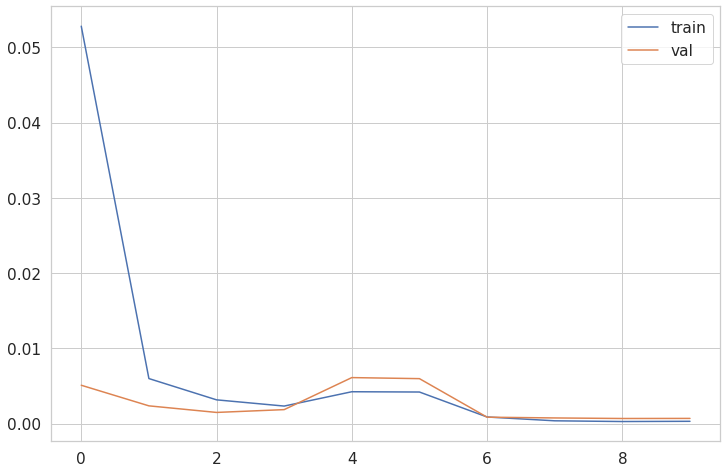

In [ ]:
import seaborn as sns

sns.set(style="whitegrid", font_scale=1.4)

# Построим график лосса при обучении и валидации

plt.figure(figsize=(12, 8))
plt.plot(losses['train'], label="train")
plt.plot(losses['val'], label="val")
plt.legend()
plt.show()

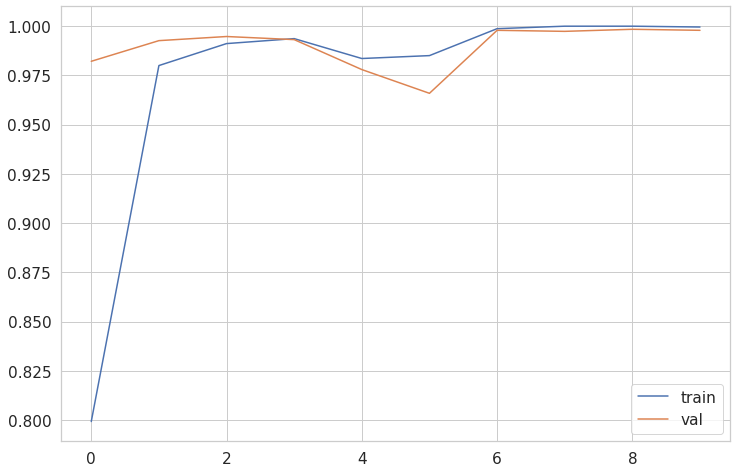

In [ ]:
sns.set(style="whitegrid", font_scale=1.4)


plt.figure(figsize=(12, 8))
plt.plot(accs['train'], label="train")
plt.plot(accs['val'], label="val")
plt.legend()
plt.show()

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model)))

Accuracy: 0.9979


* **Feature Extractor** способ, обучаем только наш классификатор

In [ ]:
model_extractor = torch.hub.load('pytorch/vision:v0.10.0', 'resnext50_32x4d', pretrained=True)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


In [ ]:
for param in model_extractor.parameters():
    print(param.requires_grad)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [ ]:
# замораживаем параметры (веса)
for param in model_extractor.parameters():
    param.requires_grad = False

# num_features - это размерность вектора фич, поступающего на вход FC-слою
num_features = 2048

# Заменяем Fully-Connected слой на наш линейный классификатор
model_extractor.fc = nn.Linear(num_features, 38)

if use_gpu:
    model_extractor = model_extractor.cuda()

loss_fn = nn.CrossEntropyLoss()

optimizer = optim.Adam(model_extractor.fc.parameters(), lr=1e-4)

# # Умножим learning_rate на 0.1 каждые 25 эпох
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=25, gamma=0.1)

In [ ]:
%%time
model_extractor,losses, accs = train_model(model_extractor, loss_fn, optimizer, exp_lr_scheduler, num_epochs=60)

Epoch::   0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

Training complete in 58m 24s
Best val Acc: 0.807027
CPU times: user 25min 9s, sys: 2min 21s, total: 27min 31s
Wall time: 58min 24s


In [ ]:
print(round(torch.cuda.max_memory_allocated()/1024**3,5), 'GB')
torch.cuda.reset_max_memory_allocated()
torch.cuda.empty_cache()

0.49001 GB


/usr/local/lib/python3.7/dist-packages/torch/cuda/memory.py:281: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  FutureWarning)


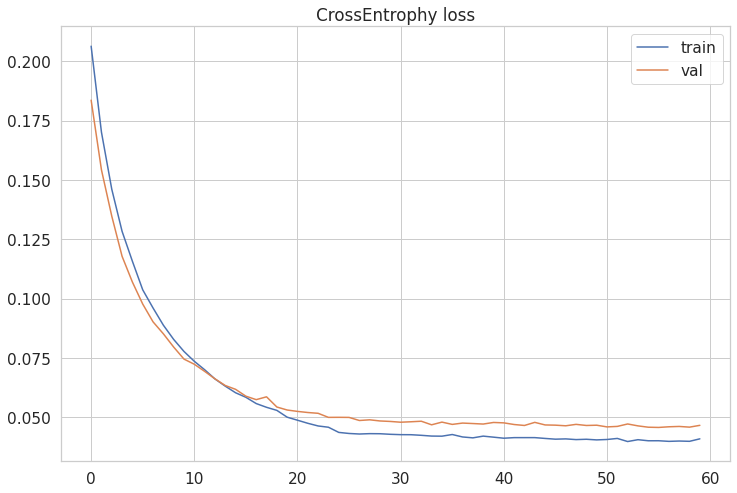

In [ ]:
import seaborn as sns

sns.set(style="whitegrid", font_scale=1.4)

plt.figure(figsize=(12, 8))
plt.plot(losses['train'], label="train")
plt.plot(losses['val'], label="val")
plt.title('CrossEntrophy loss')
plt.legend()
plt.show()

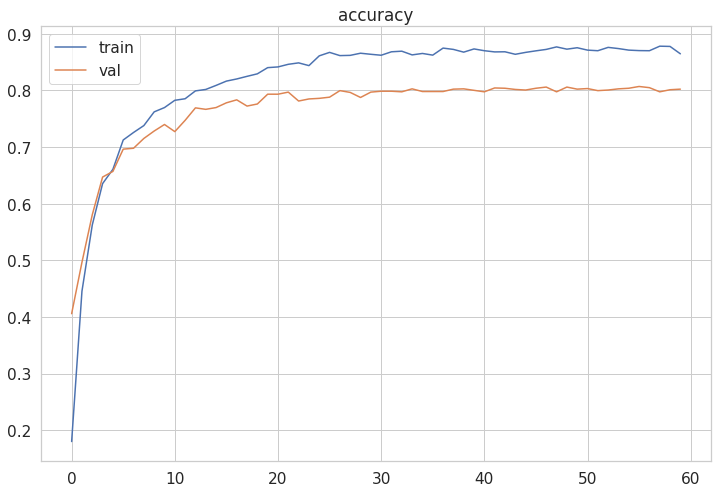

In [ ]:
sns.set(style="whitegrid", font_scale=1.4)


plt.figure(figsize=(12, 8))
plt.plot(accs['train'], label="train")
plt.plot(accs['val'], label="val")
plt.title('accuracy')
plt.legend()
plt.show()

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_extractor)))

Accuracy: 0.8023


* **Смешанный** способ:
Мы будем обучать не только последний **fully connected** слой, но и один предпоследний

In [ ]:
model_mixed = torch.hub.load('pytorch/vision:v0.10.0', 'resnext50_32x4d', pretrained=True)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


In [ ]:
model_mixed.parameters

<bound method Module.parameters of ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        

In [ ]:
# Выключаем подсчет градиентов для слоев, которые не будем обучать
for param in model_mixed.parameters():
    param.requires_grad = False

# model_mixed.layer1.requires_grad = False
# model_mixed.layer2.requires_grad = False
# model_mixed.layer3.requires_grad = False
model_mixed.layer4.requires_grad = True
    
# num_features - это размерность вектора фич, поступающего на вход FC-слою
num_features = 2048

# Заменяем Fully-Connected слой на линейный классификатор
model_mixed.fc = nn.Linear(num_features, 38)

# Использовать ли GPU
if use_gpu:
    model_mixed = model_mixed.cuda()

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# Обучаем последний слой из сверточной части и fully connected слой 
optimizer = optim.Adam(list(model_mixed.fc.parameters()) + list(model_mixed.layer4.parameters()), lr=1e-4)

# Умножим learning_rate на 0.1 каждые 35 эпох
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=35, gamma=0.1)

In [ ]:
%%time
model_mixed, losses, accs = train_model(model_mixed, loss_fn, optimizer, exp_lr_scheduler, num_epochs=80)

Epoch::   0%|          | 0/80 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

Training complete in 72m 10s
Best val Acc: 0.821185
CPU times: user 36min 29s, sys: 2min 58s, total: 39min 28s
Wall time: 1h 12min 10s


In [ ]:
print(round(torch.cuda.max_memory_allocated()/1024**3,5), 'GB')
torch.cuda.reset_max_memory_allocated()
torch.cuda.empty_cache()

0.49013 GB


/usr/local/lib/python3.7/dist-packages/torch/cuda/memory.py:281: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  FutureWarning)


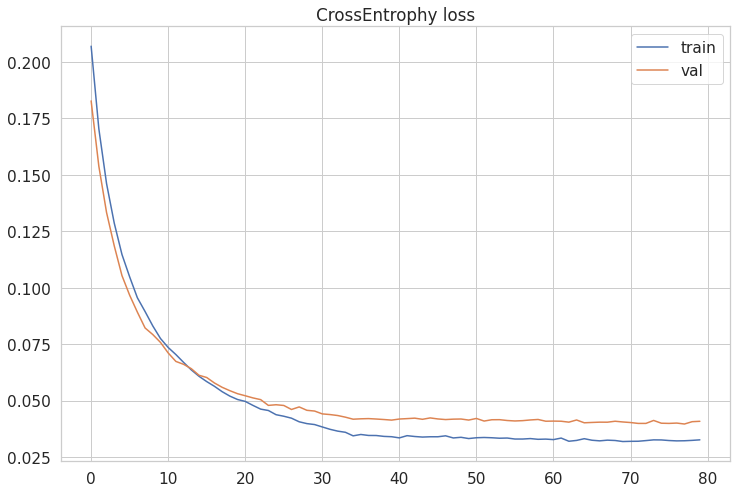

In [ ]:
import seaborn as sns

sns.set(style="whitegrid", font_scale=1.4)

# Построим график лосса при обучении и валидации

plt.figure(figsize=(12, 8))
plt.plot(losses['train'], label="train")
plt.plot(losses['val'], label="val")
plt.title('CrossEntrophy loss')
plt.legend()
plt.show()

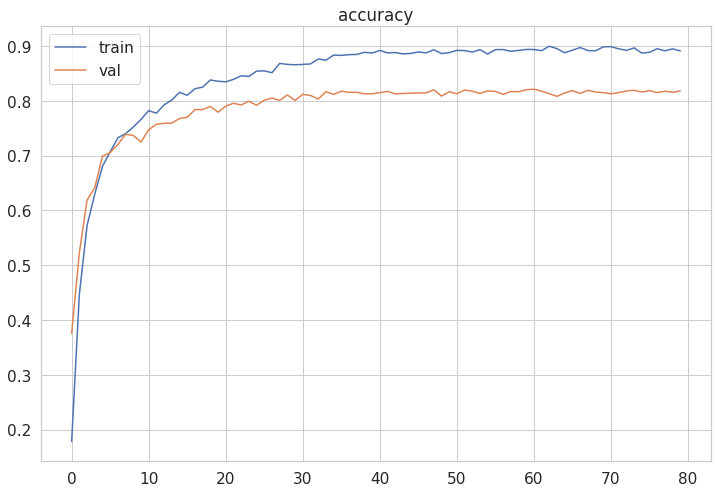

In [ ]:
sns.set(style="whitegrid", font_scale=1.4)

plt.figure(figsize=(12, 8))
plt.plot(accs['train'], label="train")
plt.plot(accs['val'], label="val")
plt.title('accuracy')
plt.legend()
plt.show()

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_mixed)))

Accuracy: 0.8180


* **Еще один** способ: не замораживаем все слои, а делаем так, чтобы шаг градиента на последних был меньше. Интерфейс оптимизатора позволяет это делать

In [10]:
model_diff_lr = torch.hub.load('pytorch/vision:v0.10.0', 'resnext50_32x4d', pretrained=True)

for param in model_diff_lr.parameters():
    param.requires_grad = False
    
model_diff_lr.layer4.requires_grad = True

num_features = 2048
model_diff_lr.fc = nn.Linear(num_features, 38)


optimizer = torch.optim.Adam(params=[
        {"params": model_diff_lr.fc.parameters()},
        {"params": model_diff_lr.layer4.parameters(), "lr": 1e-5,}
    ], 
    lr=1e-4
)

if use_gpu:
    model_diff_lr = model_diff_lr.cuda()

loss_fn = nn.CrossEntropyLoss()


# Умножаем learning_rate на 0.1 каждые 15 эпох 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=45, gamma=0.1)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


In [11]:
%%time
model_diff_lr, losses, accs = train_model(model_diff_lr, loss_fn, optimizer, exp_lr_scheduler, num_epochs=60)

Epoch::   0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

train iter::   0%|          | 0/297 [00:00<?, ?it/s]

val iter::   0%|          | 0/120 [00:00<?, ?it/s]

Training complete in 70m 28s
Best val Acc: 0.826953
CPU times: user 26min 40s, sys: 2min 15s, total: 28min 55s
Wall time: 1h 10min 28s


In [12]:
print(round(torch.cuda.max_memory_allocated()/1024**3,5), 'GB')
torch.cuda.reset_max_memory_allocated()
torch.cuda.empty_cache()

0.49001 GB


/usr/local/lib/python3.7/dist-packages/torch/cuda/memory.py:281: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  FutureWarning)


In [13]:
torch.save(model_diff_lr.state_dict(), 'resnext50_diff_lr.pth')

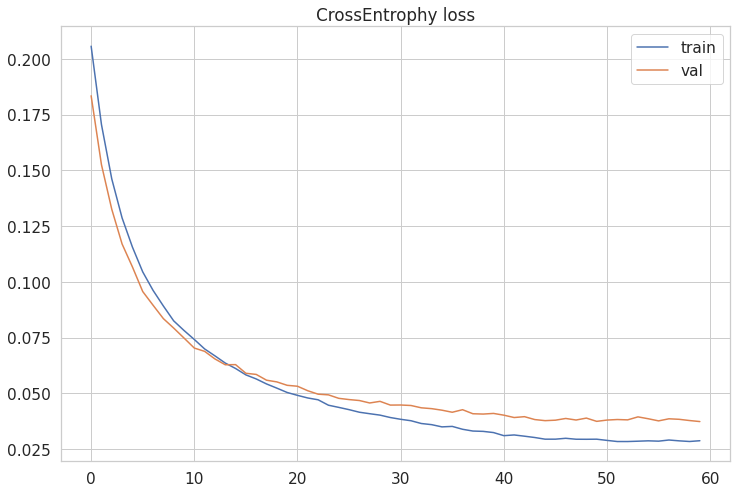

In [14]:
import seaborn as sns

sns.set(style="whitegrid", font_scale=1.4)

# Построим график лосса при обучении и валидации

plt.figure(figsize=(12, 8))
plt.plot(losses['train'], label="train")
plt.plot(losses['val'], label="val")
plt.title('CrossEntrophy loss')
plt.legend()
plt.show()

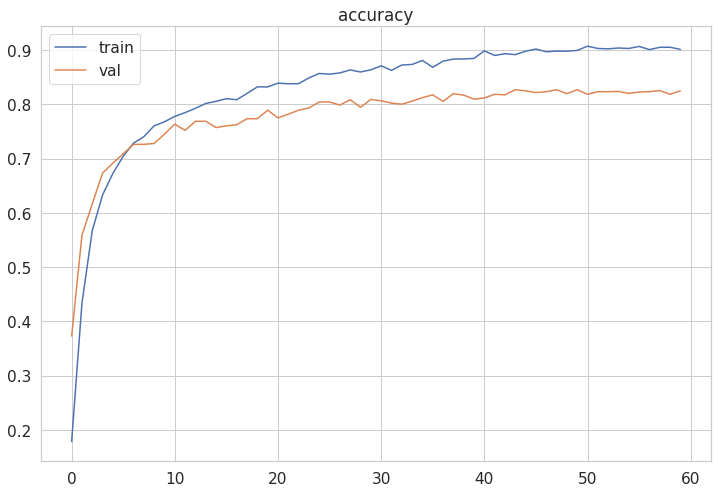

In [15]:
sns.set(style="whitegrid", font_scale=1.4)


plt.figure(figsize=(12, 8))
plt.plot(accs['train'], label="train")
plt.plot(accs['val'], label="val")
plt.title('accuracy')
plt.legend()
plt.show()

In [16]:
print("Accuracy: {0:.4f}".format(evaluate(model_diff_lr)))

Accuracy: 0.8249


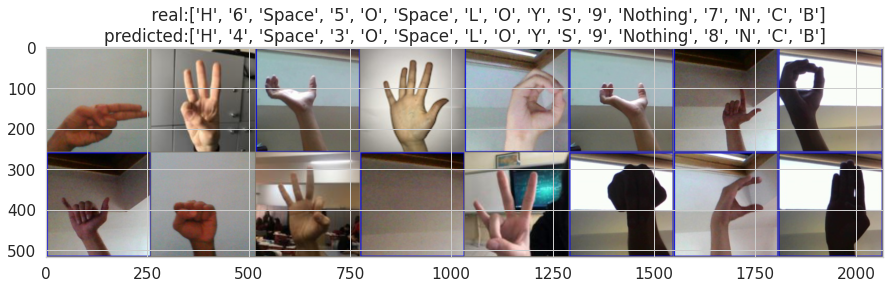

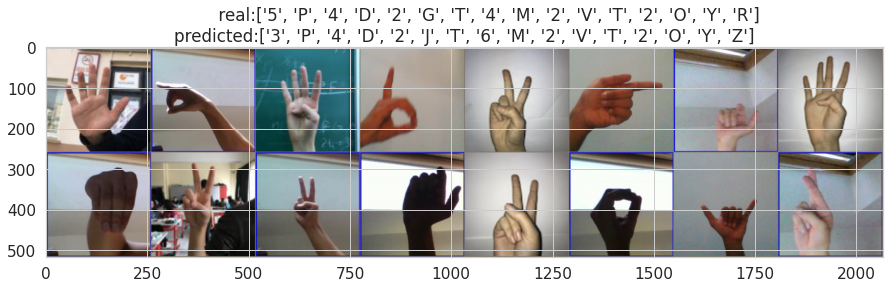

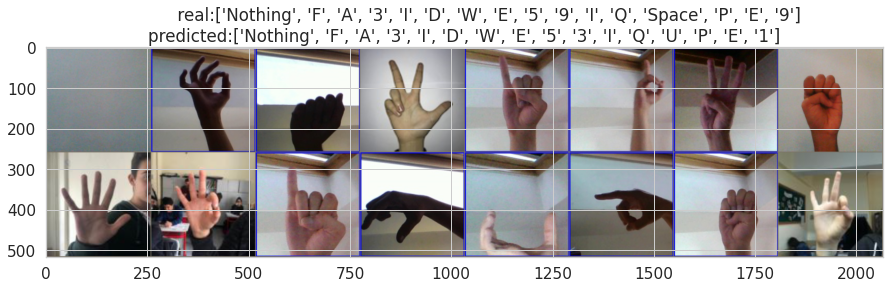

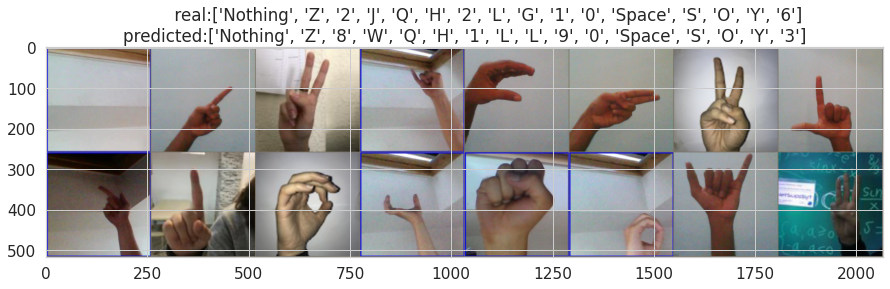

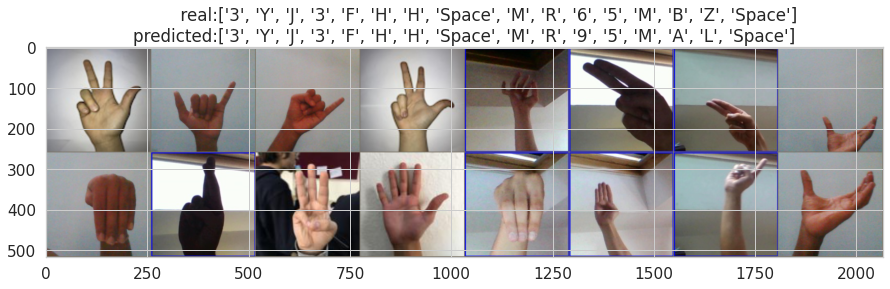

...

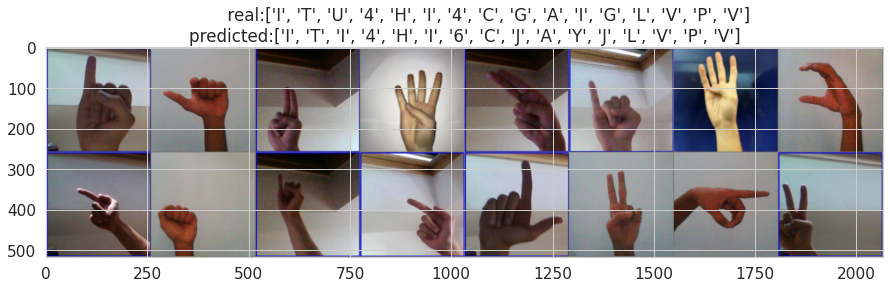

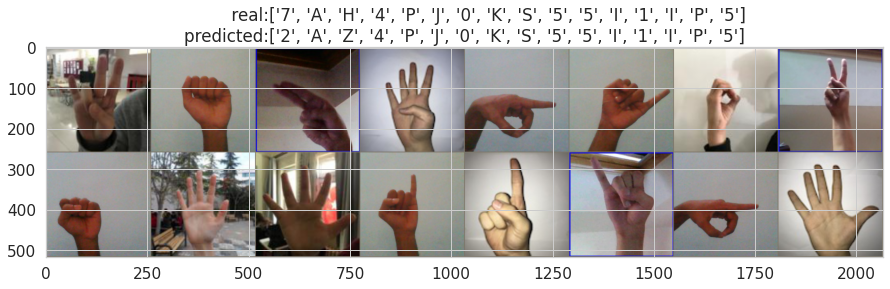

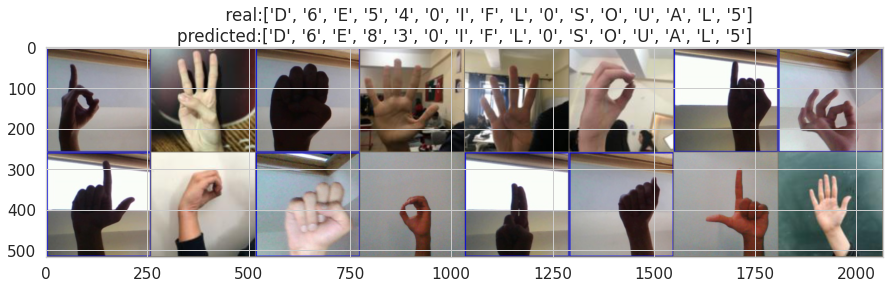

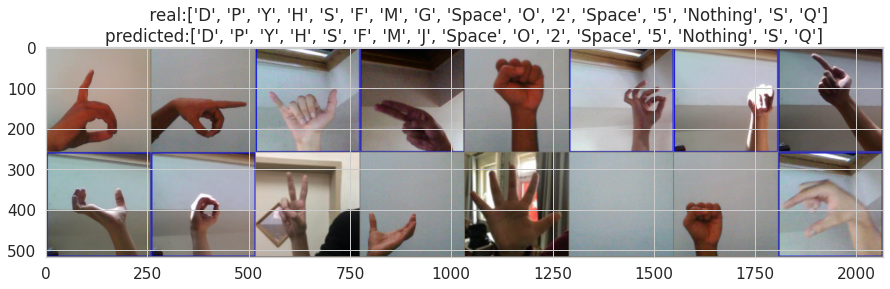

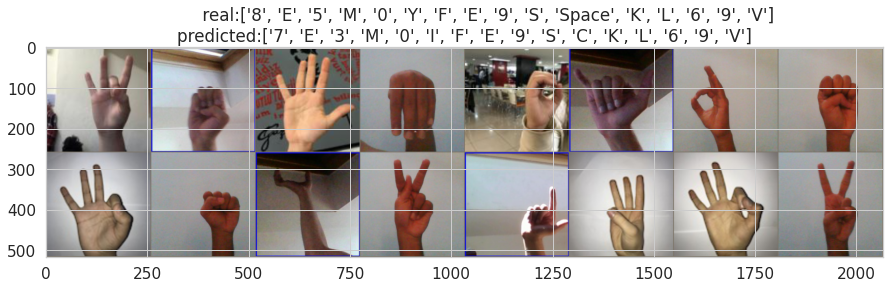

In [19]:
visualize_model(model_diff_lr, num_batches=20)